# A Common Pipeline for Text Clustering

In [1]:
# Load data from Hugging Face
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")["train"]

# Extract metadata
abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

In [2]:
print(
    f"""
    Title: {titles[0]}
    
    Abstract: {abstracts[0]}
    """
)


    Title: Introduction to Arabic Speech Recognition Using CMUSphinx System
    
    Abstract:   In this paper Arabic was investigated from the speech recognition problem
point of view. We propose a novel approach to build an Arabic Automated Speech
Recognition System (ASR). This system is based on the open source CMU Sphinx-4,
from the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;
speaker-independent, continuous speech recognition system based on discrete
Hidden Markov Models (HMMs). We build a model using utilities from the
OpenSource CMU Sphinx. We will demonstrate the possible adaptability of this
system to Arabic voice recognition.

    


In [3]:
import pickle

with open("embeddings.pickle", "rb") as f:
    embeddings = pickle.load(f)
with open("hdbscan.pickle", "rb") as f:
    hdbscan_model = pickle.load(f)
with open("reduced_embeddings.pickle", "rb") as f:
    reduced_embeddings = pickle.load(f)
with open("umap.pickle", "rb") as f:
    umap_model = pickle.load(f)

## Embedding documents

In [7]:
from sentence_transformers import SentenceTransformer

# Create an embedding for each abstract
embedding_model = SentenceTransformer('thenlper/gte-small')
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [4]:
# embeddings.shape

(44949, 384)

## Reducing the Dimensionality of Embeddings

In [5]:
from umap import UMAP

# We reduce the input embeddings from 384 dimenions to 5 dimenions
umap_model = UMAP(
    n_components=5, min_dist=0.0, metric='cosine', random_state=42
)
reduced_embeddings = umap_model.fit_transform(embeddings)

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


## Cluster the reduced embeddings

In [6]:
from hdbscan import HDBSCAN

# We fit the model and extract the clusters
hdbscan_model = HDBSCAN(
    min_cluster_size=50, metric='euclidean', cluster_selection_method='eom'
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_

# How many clusters did we generate?
len(set(clusters))

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


147

In [7]:
# Checkign some docs in cluster 0

import numpy as np

# Print first three documents in cluster 0

cluster = 0
for index in np.where(clusters==cluster)[0][:3]:
    print(abstracts[index][:300] + "... \n")

  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo... 

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang... 

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf... 



## Visualizing clusters

In [8]:
import pandas as pd

# Reduce 384-dimensional embeddings to two dimensions for easier visualization
reduced_embeddings = UMAP(
    n_components=2, min_dist=0.0, metric='cosine', random_state=42
).fit_transform(embeddings)

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [9]:
# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

In [10]:
# Select outliers and non-outliers
clusters_df = df.loc[df.cluster != "-1", :]
outliers_df = df.loc[df.cluster == "-1", :]

(-8.56722378730774,
 10.846851587295532,
 -1.6190044075250625,
 16.330836394429205)

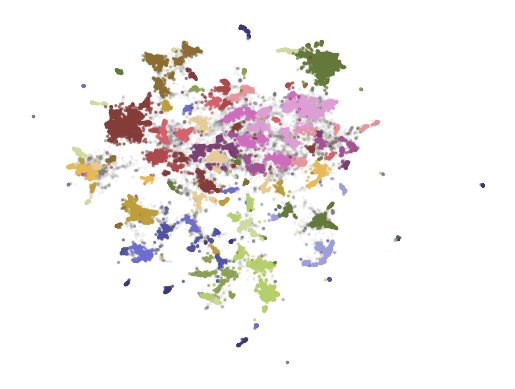

In [11]:
import matplotlib.pyplot as plt

# Plot outliers and non-outliers seperately
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c="grey")
plt.scatter(
    clusters_df.x, clusters_df.y, c=clusters_df.cluster.astype(int),
    alpha=0.6, s=2, cmap='tab20b'
)
plt.axis('off')

# From Text Clustering to Topic Modeling

In [16]:
from bertopic import BERTopic

In [17]:
# Train our topic model with previosuly defined models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True
).fit(abstracts, embeddings)

2024-09-08 03:33:22,000 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


2024-09-08 03:34:24,967 - BERTopic - Dimensionality - Completed ✓
2024-09-08 03:34:24,969 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid usi

In [18]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13660,-1_of_the_and_to,"[of, the, and, to, in, we, language, for, that...",[ This paper describes our system developed f...
1,0,2291,0_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...","[ Recently, masked prediction pre-training ha..."
2,1,2248,1_question_questions_answer_qa,"[question, questions, answer, qa, answering, a...",[ Multi-hop question answering (QA) requires ...
3,2,1186,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Medical text learning has recently emerged ...
4,3,980,3_translation_nmt_machine_bleu,"[translation, nmt, machine, bleu, neural, engl...",[ Neural Machine Translation (NMT) models ach...
...,...,...,...,...,...
142,141,54,141_mixed_code_sentiment_mixing,"[mixed, code, sentiment, mixing, analysis, eng...",[ In today's interconnected and multilingual ...
143,142,53,142_counseling_mental_therapy_health,"[counseling, mental, therapy, health, psychoth...",[ Mental health care poses an increasingly se...
144,143,53,143_emoji_emojis_emoticons_sentiment,"[emoji, emojis, emoticons, sentiment, social, ...",[ The frequent use of Emojis on social media ...
145,144,53,144_prompt_prompts_optimization_prompting,"[prompt, prompts, optimization, prompting, llm...",[ Prompt optimization aims to find the best p...


In [19]:
topic_model.get_topic(0)

[('speech', 0.029022387039168967),
 ('asr', 0.01935850863847395),
 ('recognition', 0.013910812417138112),
 ('end', 0.010092576881236366),
 ('acoustic', 0.009593445638755563),
 ('speaker', 0.006951099047549252),
 ('audio', 0.006858313884764736),
 ('the', 0.006701571498738495),
 ('model', 0.006513681452048559),
 ('to', 0.006509258439442663)]

In [20]:
topic_model.find_topics("topic modeling")

([25, -1, 30, 112, 2],
 [0.9550356, 0.9119425, 0.90825224, 0.9053288, 0.9050542])

In [21]:
topic_model.get_topic(25)

[('topic', 0.06961465570084459),
 ('topics', 0.03694844173043962),
 ('lda', 0.016440327562051),
 ('latent', 0.013946590974272375),
 ('documents', 0.012725172284576047),
 ('document', 0.01272404822763363),
 ('modeling', 0.012317026453053288),
 ('dirichlet', 0.010189246090997087),
 ('word', 0.008746959373268255),
 ('allocation', 0.008021042067369056)]

In [22]:
# Let's see if BERTopic abstract is also assign to this topic
# print(topic_model.topics_)
topic_model.topics_[titles.index("BERTopic: Neural topic modeling with a class-based TF-IDF procedure")] # topic_models.topics_ contains topics generated for each doc

25

In [23]:
# Visualize topics and documemts
fig = topic_model.visualize_documents(
    titles, 
    reduced_embeddings=reduced_embeddings, 
    width=1200, 
    hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

In [24]:
# Visualize barchart with ranked keywords
topic_model.visualize_barchart()

In [25]:
# Visualize relationships between topics
topic_model.visualize_heatmap(n_clusters=30)

In [26]:
# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()

# Adding a specia LEGO block -> Reranker

In [27]:
# Save original representations
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [71]:
import pandas as pd

def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models """
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):
        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]
    
    return df

## KeyBERTInspired

In [72]:
from bertopic.representation import KeyBERTInspired

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,phonetic | speech | transcription | language |...
1,1,question | questions | answer | qa | answering,questions | comprehension | answering | retrie...
2,2,medical | clinical | biomedical | patient | notes,nlp | text | clinical | language | ehr
3,3,translation | nmt | machine | bleu | neural,translation | translations | translate | trans...
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


## Maximal marginal relevance

In [73]:
from bertopic.representation import MaximalMarginalRelevance

# Update our topic representations to MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.4)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,asr | audio | automatic | error | training
1,1,question | questions | answer | qa | answering,questions | retrieval | comprehension | knowle...
2,2,medical | clinical | biomedical | patient | notes,clinical | biomedical | health | extraction | ...
3,3,translation | nmt | machine | bleu | neural,translation | nmt | bleu | neural | parallel
4,4,summarization | summaries | summary | abstract...,summarization | summaries | extractive | rouge...


# The text generation LEGO block

In [74]:
from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents: 
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Update our topic representations using Flan-T5
generator = pipeline('text2text-generation', model='google/flan-t5-small', device="cuda")
representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer="whitespace"
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 147/147 [00:09<00:00, 14.90it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,Speech recognition | | | |
1,1,question | questions | answer | qa | answering,Question answering | | | |
2,2,medical | clinical | biomedical | patient | notes,Science/Tech | | | |
3,3,translation | nmt | machine | bleu | neural,Learning from a neural machine translation mod...
4,4,summarization | summaries | summary | abstract...,Abstractive text summarization | | | |


## Using Cohere

In [79]:
import os
# import openai
import cohere
from dotenv import find_dotenv, load_dotenv
from bertopic.representation import Cohere

load_dotenv(find_dotenv(), override=True)

prompt = """I have a topic that contains the following documents: 
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Create client
client = cohere.Client(os.getenv("COHERE_API_KEY"))

representation_model = Cohere(
    client, model="command", prompt=prompt
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 147/147 [05:00<00:00,  2.04s/it]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,The topic appears to be about advances in auto...
1,1,question | questions | answer | qa | answering,"Based on the provided documents and keywords, ..."
2,2,medical | clinical | biomedical | patient | notes,This topic covers various aspects of using lar...
3,3,translation | nmt | machine | bleu | neural,The topic revolves around improving the effect...
4,4,summarization | summaries | summary | abstract...,The topic is about text summarization and the ...


In [4]:
# topic_model.save("./topic_model", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)
from bertopic import BERTopic
topic_model = BERTopic.load("./topic_model/")

2024-09-08 09:32:51,656 - BERTopic - WARNING: You are loading a BERTopic model without explicitly defining an embedding model. If you want to also load in an embedding model, make sure to use `BERTopic.load(my_model, embedding_model=my_embedding_model)`.


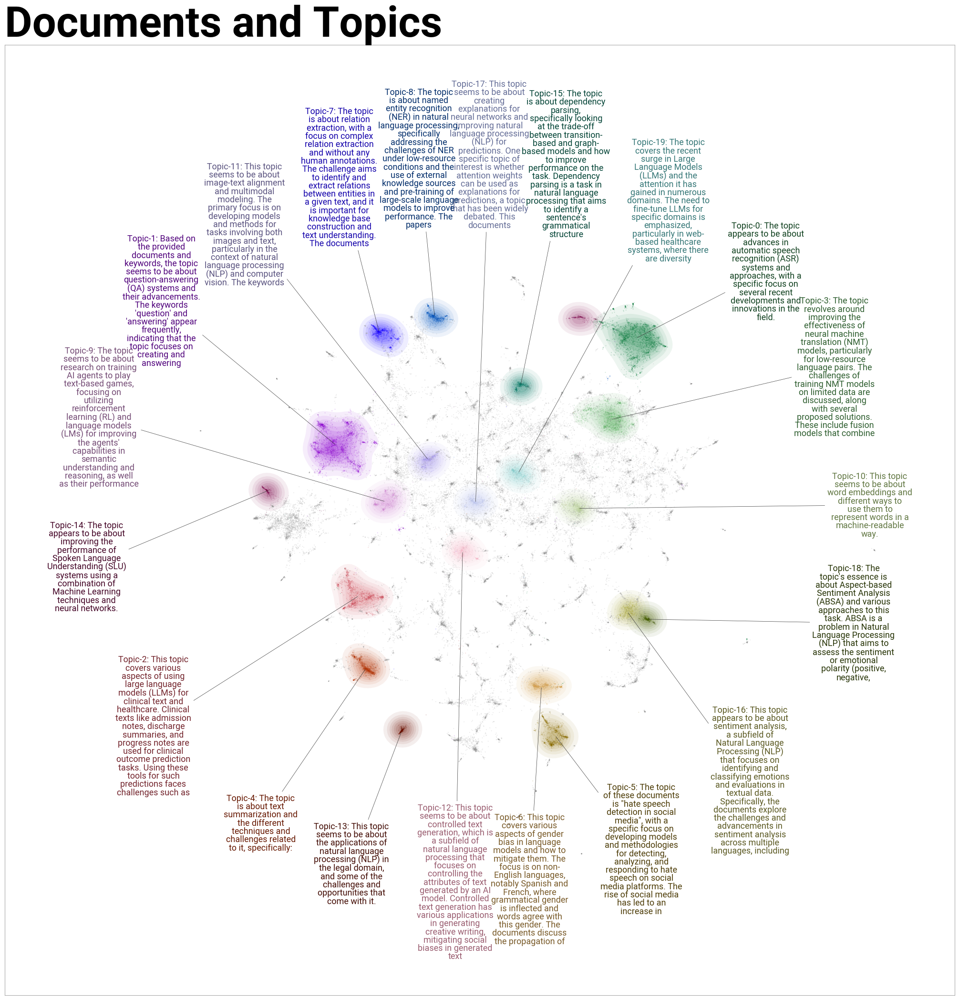

In [7]:
# Visualize topics and documents
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    height=2000,
    width=2000,
    label_font_size=13,
    label_wrap_width=20,
    use_medoids=True,
)